# Jun 29th, 2022 (plot pi together for all: 512)

**Motivation**: final: ???  <br>

In [1]:
# HIDE CODE


import os
import sys
from pprint import pprint
from copy import deepcopy as dc
from os.path import join as pjoin
from scipy.ndimage import gaussian_filter
from IPython.display import display, IFrame, HTML

# tmp & extras dir
git_dir = pjoin(os.environ['HOME'], 'Dropbox/git')
extras_dir = pjoin(git_dir, 'jb-Ca-fMRI/_extras')
fig_base_dir = pjoin(git_dir, 'jb-Ca-fMRI/figs')
tmp_dir = pjoin(git_dir, 'jb-Ca-fMRI/tmp')

# GitHub
sys.path.insert(0, pjoin(git_dir, '_Ca-fMRI'))
from model.configuration import Config
from model.mouse import Mice
from analysis.bootstrap import *
from analysis.network import *
from utils.render import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from tqdm.notebook import tqdm
%matplotlib inline
set_style()

In [2]:
# HIDE CODE


def sort_pi_dict(pi_dict):
    pi_sorted = pi_dict.copy()
    for i in range(len(pi_dict)):
        lbl, x = list(pi_dict.items())[i]
        if i == 0:
            continue
        src = list(pi_sorted.values())[i - 1]
        gmap = find_best_mappings(
            centroids=src,
            data={0: x},
            match_metric='cosine',
            global_order='infer',
        )[0]
        ids = list(gmap.values())
        ids = ids + list(np.delete(range(len(x)), ids))
        pi_sorted[lbl] = x[ids]
    return pi_sorted

## Prepare (128)

In [3]:
nn = 128
fig_dir = pjoin(fig_base_dir, 'paper2.0', 'pi_ctx', f'n{nn}')
os.makedirs(fig_dir, exist_ok=True)
print(fig_dir)

kws_fig = {
    'transparent': False,
    'bbox_inches': 'tight',
    'dpi': 200,
}

/home/hadi/Dropbox/git/jb-Ca-fMRI/figs/paper2.0/pi_ctx/n128

In [4]:
mice = Mice(nn)

_BOLD = 'BOLD'
_CAS = r'Ca$^{2\!\!+}$' + ' (slow)'
_CAF = r'Ca$^{2\!\!+}$' + ' (fast)'
mako = sns.color_palette('mako', as_cmap=True)
rocket = sns.color_palette('rocket', as_cmap=True)
pal = {_BOLD: rocket(0.6), _CAS: mako(0.6), _CAF: to_rgb('C8')} # mako(0.3)}

In [5]:
task = 'rest'
mice.setup_func_data(task, band_ca=(0.01, 0.5))

num_k, p = 25, 20
perc = f'p{p}-sample'
props_base = {
    'kw_kmeans': {'n_init': 100},
    'perc': perc,
    'num_k': num_k,
    'mice': mice,
    'task': task,
    'metric': 'pearson',
    'match_using': 'gam',
    'match_metric': 'euclidean',
    'graph_type': 'real',
    'verbose': False,
}
props_ca = {'mode': 'ca2', **props_base}
props_bo = {'mode': 'bold-lite', **props_base}
bs = Base(**props_ca)

In [6]:
kk_ca = range(3, 21, 1)
kk_bo = range(3, 21, 1)

### Ca2 (slow)

In [7]:
mice.setup_func_data(task, band_ca=(0.01, 0.5))

In [8]:
%%time

pi_avg = {}
pi_pr_avg = {}
pi_pr_all = {}
for kk in kk_ca:
    props_ca['num_k'] = kk
    bt = BootStrap(**props_ca)
    pi_avg[f'{_CAS}\nk{kk}'.replace(' ', '')] = avg(bt.run_pi)
    pi_pr_avg[f'{_CAS}\nk{kk}(pr95)'.replace(' ', '')] = avg(bt.pi_prune)
    pi_pr_all[kk] = bt.pi_prune

# sort
d2p_cas = sort_pi_dict(pi_avg)
d2p_cas_pr = sort_pi_dict(pi_pr_avg)

CPU times: user 11.1 s, sys: 13.1 s, total: 24.2 s
Wall time: 1min 1s


In [9]:
bt.fit_meta

{
    'time_start': '2022_06_11_13-49',
    'min_runs_thresh': 0.6,
    'min_node_thresh': 0.7,
    'best_node_freq_q': 0.93,
    'num_total_runs': 110,
    'fraction_accepted_runs': 0.6727272727272727,
    'fraction_good_nodes': 0.7368421052631579,
    'time_end': '2022_06_11_14-04'
}

#### Show pi ctx (raw)

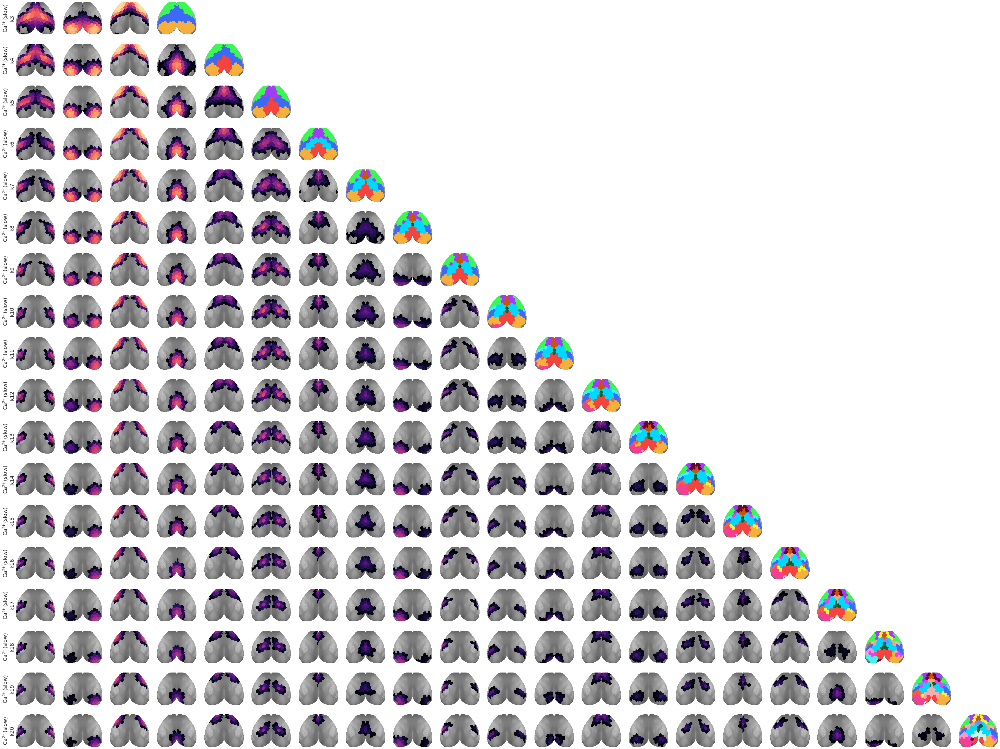

In [10]:
fig1, _ = bs.show(
    data=d2p_cas,
    figsize=(64, 50),
    ylabel_fontsize=19,
    contour=False,
)
fig1.savefig(pjoin(fig_dir, f'CAS_p20_k[{min(kk_ca)}-{max(kk_ca)}].png'), **kws_fig)

#### Show pi ctx (prune)

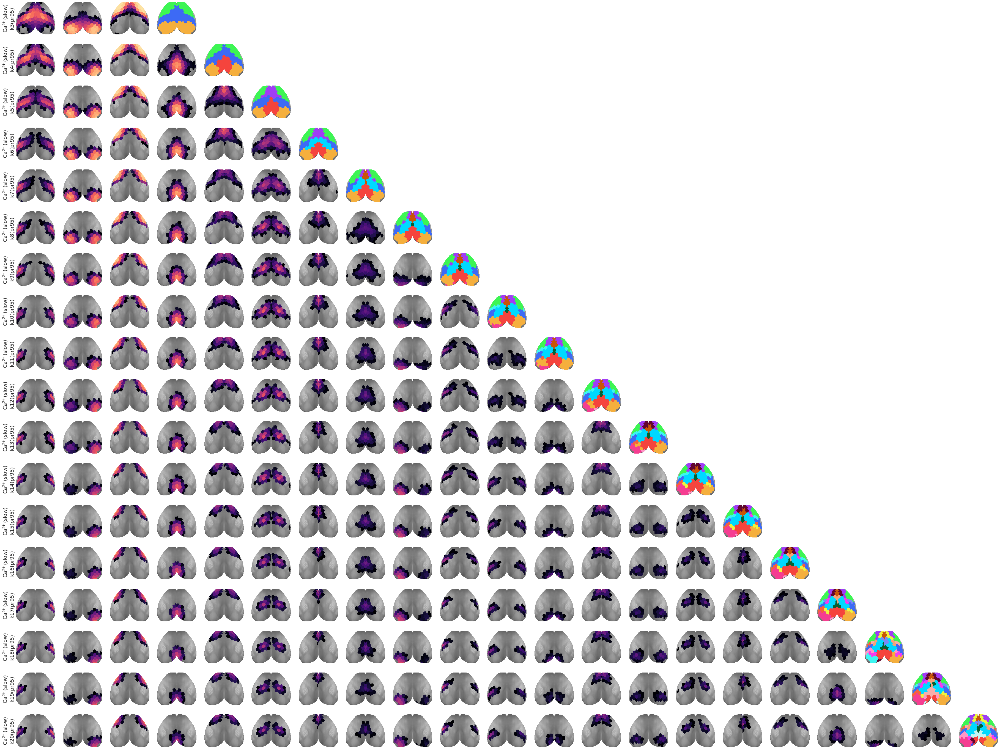

In [11]:
fig2, _ = bs.show(
    data=d2p_cas_pr,
    figsize=(64, 50),
    ylabel_fontsize=19,
    contour=False,
)
fig2.savefig(pjoin(fig_dir, f'CAS_p20_k[{min(kk_ca)}-{max(kk_ca)}]_pr.png'), **kws_fig)

#### H

In [12]:
h_all = []
for kk, x in pi_pr_all.items():
    h = sp_stats.entropy(bn.nanmean(x, -3), axis=-2) / np.log(x.shape[-2])
    h_all.append(np.expand_dims(h, 0))
h_all = np.concatenate(h_all)
h_avg = avg(h_all, 1, 1)

np.nanmin(h_avg), np.nanmax(h_avg)

(0.10319809798906163, 0.7775895588576988)

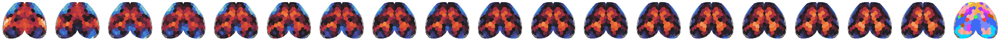

In [13]:
_ = bs.show(
    h_avg,
    vmin=np.nanmin(h_avg),
    vmax=np.nanmax(h_avg),
    figsize=(50, 7),
    cmap='icefire',
    contour=False,
)

In [14]:
sim_h = dist2sim(sp_dist.squareform(sp_dist.pdist(
    h_avg, metric='correlation')))

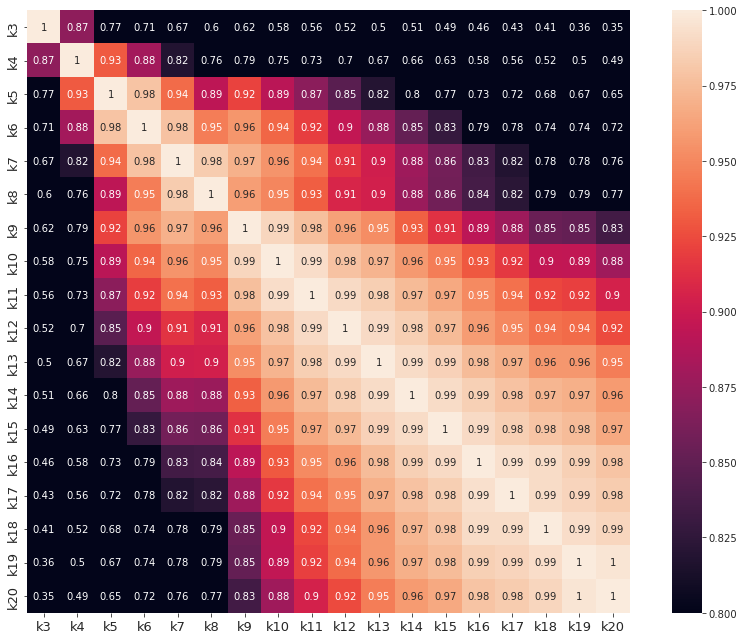

In [15]:
fig, ax = create_figure(1, 1, (12, 9))

sns.heatmap(
    sim_h,
    vmin=0.8,
    vmax=1.0,
    square=True,
    annot=True,
    fmt='.2g',
    ax=ax,
)
tick_labels = [f"k{k}" for k in kk_ca]
ax.set(
    xticklabels=tick_labels,
    yticklabels=tick_labels,
)
ax.tick_params(axis='both', labelsize=13)
plt.show()

### Ca2 (fast)

In [16]:
mice.setup_func_data(task, band_ca=0.5)

In [17]:
%%time

pi_avg = {}
pi_pr_avg = {}
pi_pr_all = {}
for kk in kk_ca:
    props_ca['num_k'] = kk
    bt = BootStrap(**props_ca)
    pi_avg[f'{_CAF}\nk{kk}'.replace(' ', '')] = avg(bt.run_pi)
    pi_pr_avg[f'{_CAF}\nk{kk}(pr95)'.replace(' ', '')] = avg(bt.pi_prune)
    pi_pr_all[kk] = bt.pi_prune

# sort
d2p_caf = sort_pi_dict(pi_avg)
d2p_caf_pr = sort_pi_dict(pi_pr_avg)

CPU times: user 10.4 s, sys: 12.3 s, total: 22.7 s
Wall time: 59.2 s


In [18]:
bt.fit_meta

{
    'time_start': '2022_06_11_14-15',
    'min_runs_thresh': 0.6,
    'min_node_thresh': 0.5699999999999998,
    'best_node_freq_q': 0.885,
    'num_total_runs': 110,
    'fraction_accepted_runs': 0.6363636363636364,
    'fraction_good_nodes': 0.5789473684210527,
    'time_end': '2022_06_11_14-28'
}

#### Show pi ctx (raw)

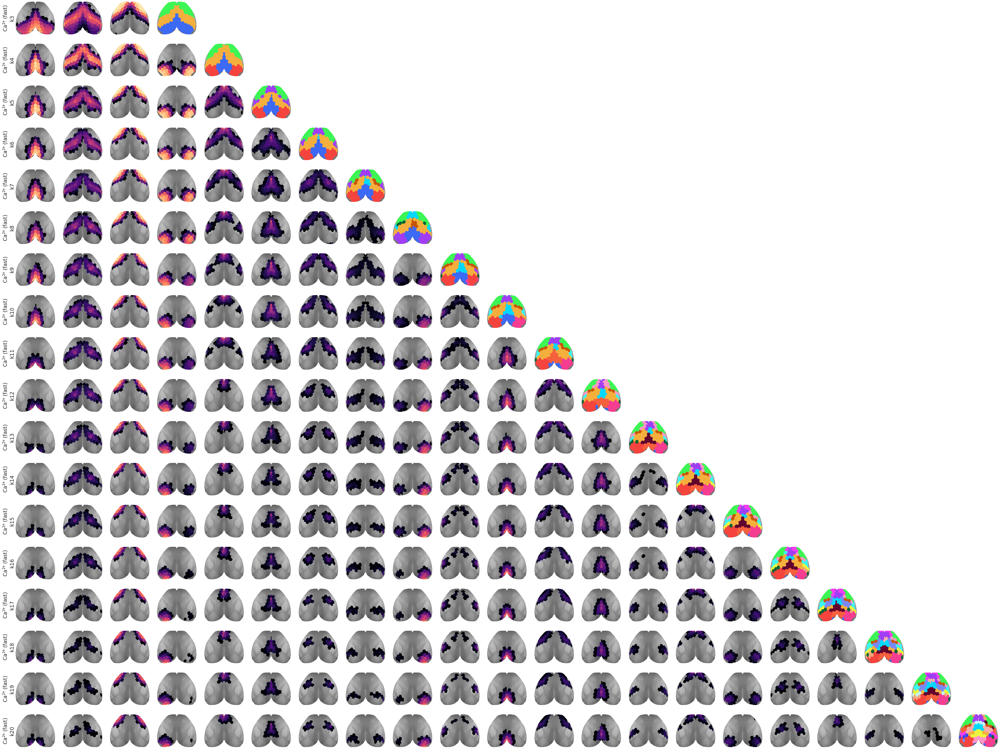

In [19]:
fig1, _ = bs.show(
    data=d2p_caf,
    figsize=(64, 50),
    ylabel_fontsize=19,
    contour=False,
)
fig1.savefig(pjoin(fig_dir, f'CAF_p20_k[{min(kk_ca)}-{max(kk_ca)}].png'), **kws_fig)

#### Show pi ctx (prune)

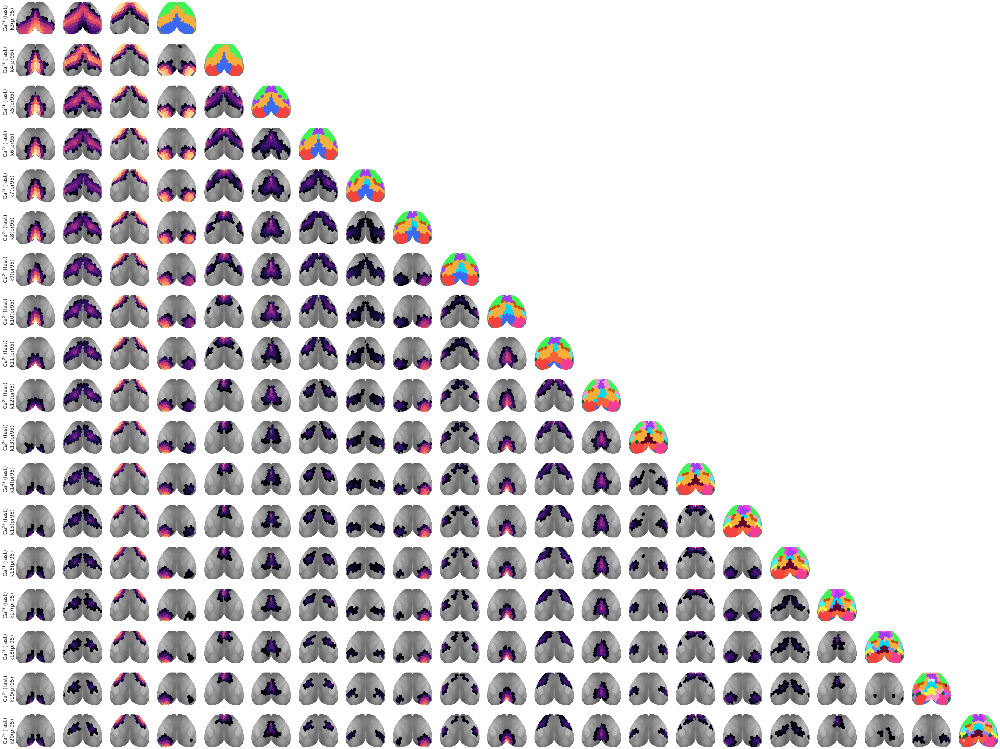

In [20]:
fig2, _ = bs.show(
    data=d2p_caf_pr,
    figsize=(64, 50),
    ylabel_fontsize=19,
    contour=False,
)
fig2.savefig(pjoin(fig_dir, f'CAF_p20_k[{min(kk_ca)}-{max(kk_ca)}]_pr.png'), **kws_fig)

#### H

In [21]:
h_all = []
for kk, x in pi_pr_all.items():
    h = sp_stats.entropy(bn.nanmean(x, -3), axis=-2) / np.log(x.shape[-2])
    h_all.append(np.expand_dims(h, 0))
h_all = np.concatenate(h_all)
h_avg = avg(h_all, 1, 1)

np.nanmin(h_avg), np.nanmax(h_avg)

(0.034552713632723414, 0.8455619701759586)

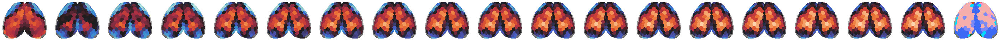

In [22]:
_ = bs.show(
    h_avg,
    vmin=np.nanmin(h_avg),
    vmax=np.nanmax(h_avg),
    figsize=(50, 7),
    cmap='icefire',
    contour=False,
)

In [23]:
sim_h = dist2sim(sp_dist.squareform(sp_dist.pdist(
    h_avg[:, np.isnan(h_avg).sum(0) == 0], metric='correlation')))

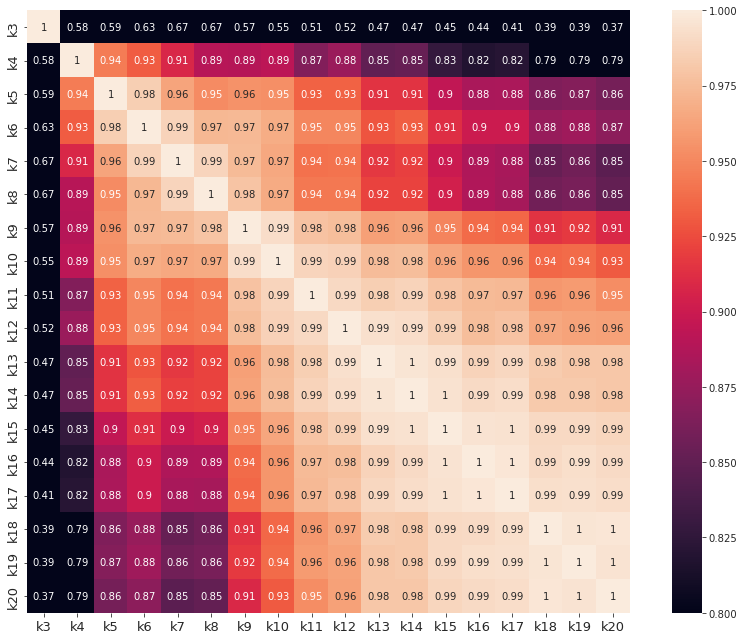

In [24]:
fig, ax = create_figure(1, 1, (12, 9))

sns.heatmap(
    sim_h,
    vmin=0.8,
    vmax=1.0,
    square=True,
    annot=True,
    fmt='.2g',
    ax=ax,
)
tick_labels = [f"k{k}" for k in kk_ca]
ax.set(
    xticklabels=tick_labels,
    yticklabels=tick_labels,
)
ax.tick_params(axis='both', labelsize=13)
plt.show()

### BOLD

In [25]:
%%time

pi_avg = {}
pi_pr_avg = {}
pi_pr_all = {}
for kk in kk_bo:
    props_bo['num_k'] = kk
    bt = BootStrap(**props_bo)
    pi_avg[f'{_BOLD}\nk{kk}'.replace(' ', '')] = avg(bt.run_pi)
    pi_pr_avg[f'{_BOLD}\nk{kk}(pr95)'.replace(' ', '')] = avg(bt.pi_prune)
    pi_pr_all[kk] = bt.pi_prune

# sort
d2p_bo = sort_pi_dict(pi_avg)
d2p_bo_pr = sort_pi_dict(pi_pr_avg)

CPU times: user 24.3 s, sys: 30.6 s, total: 55 s
Wall time: 2min 23s


In [26]:
bt.fit_meta

{
    'time_start': '2022_07_02,01:59',
    'min_runs_thresh': 0.75,
    'min_node_thresh': 0.85,
    'best_node_freq_q': 0.985,
    'num_total_runs': 114,
    'fraction_accepted_runs': 0.8859649122807017,
    'fraction_good_nodes': 0.8618421052631579,
    'time_end': '2022_07_02,02:32'
}

#### Show pi ctx (raw)

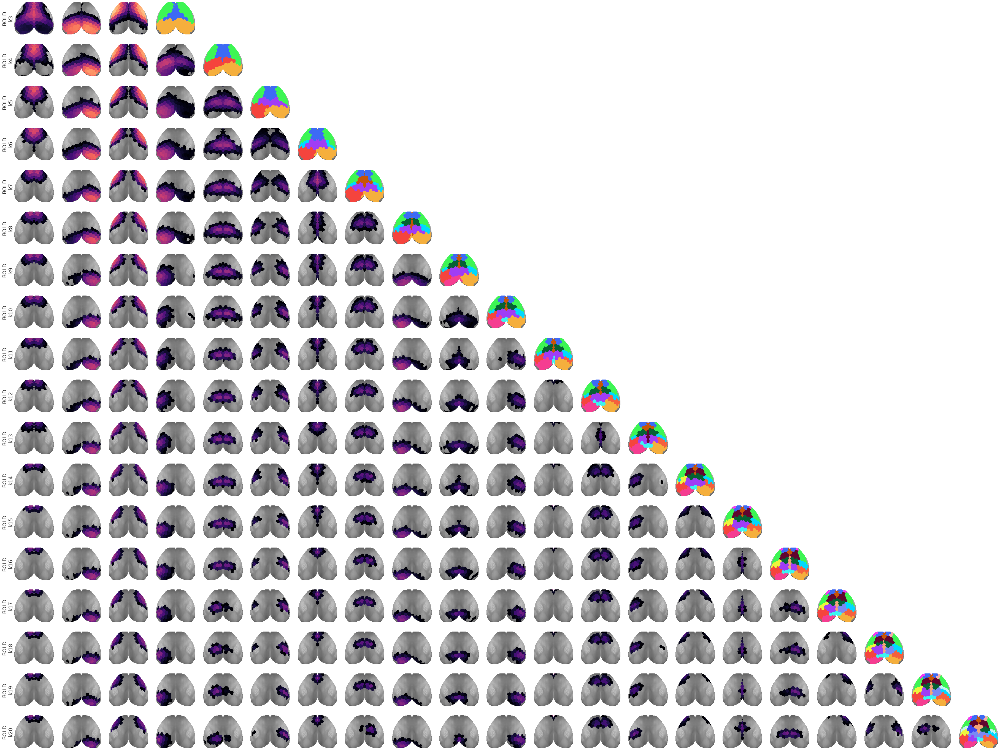

In [27]:
fig1, _ = bs.show(
    data=d2p_bo,
    figsize=(64, 50),
    ylabel_fontsize=19,
    contour=False,
)
fig1.savefig(pjoin(fig_dir, f'BOLD_p20_k[{min(kk_bo)}-{max(kk_bo)}].png'), **kws_fig)

#### Show pi ctx (prune)

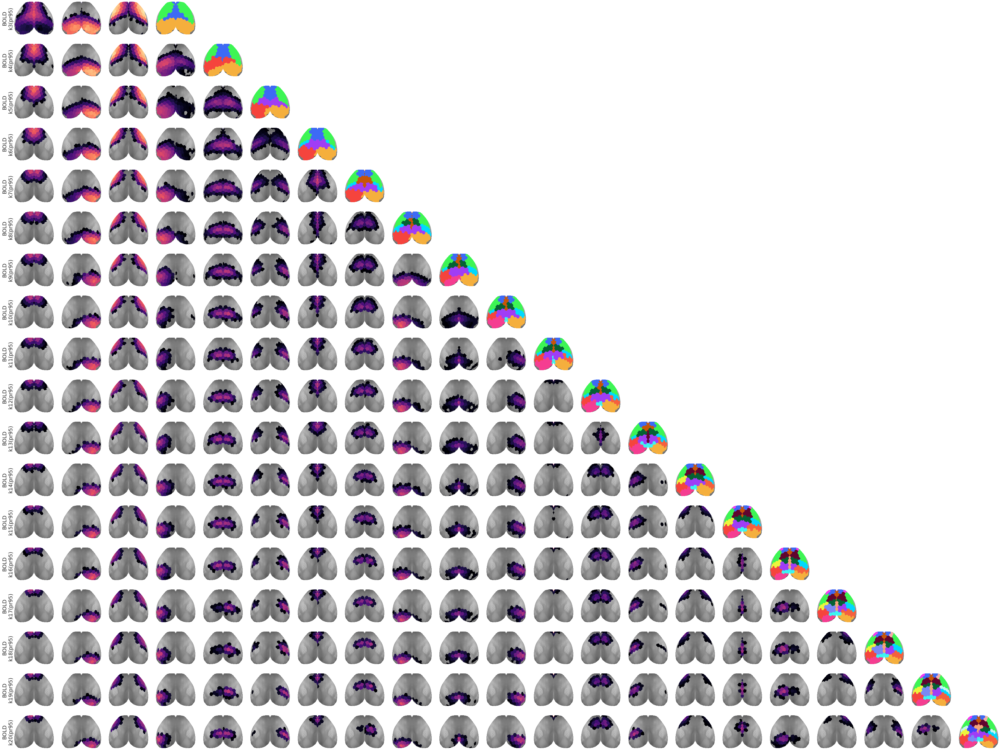

In [28]:
fig2, _ = bs.show(
    data=d2p_bo_pr,
    figsize=(64, 50),
    ylabel_fontsize=19,
    contour=False,
)
fig2.savefig(pjoin(fig_dir, f'BOLD_p20_k[{min(kk_bo)}-{max(kk_bo)}]_pr.png'), **kws_fig)

#### H

In [29]:
h_all = []
for kk, x in pi_pr_all.items():
    h = sp_stats.entropy(bn.nanmean(x, -3), axis=-2) / np.log(x.shape[-2])
    h_all.append(np.expand_dims(h, 0))
h_all = np.concatenate(h_all)
h_avg = avg(h_all, 1, 1)

np.nanmin(h_avg), np.nanmax(h_avg)

(0.11738632095387887, 0.8024822989222141)

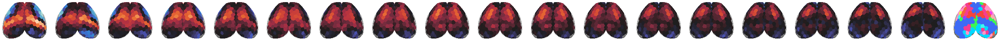

In [30]:
_ = bs.show(
    h_avg,
    vmin=np.nanmin(h_avg),
    vmax=np.nanmax(h_avg),
    figsize=(50, 7),
    cmap='icefire',
    contour=False,
)

In [31]:
sim_h = dist2sim(sp_dist.squareform(sp_dist.pdist(
    h_avg, metric='correlation')))

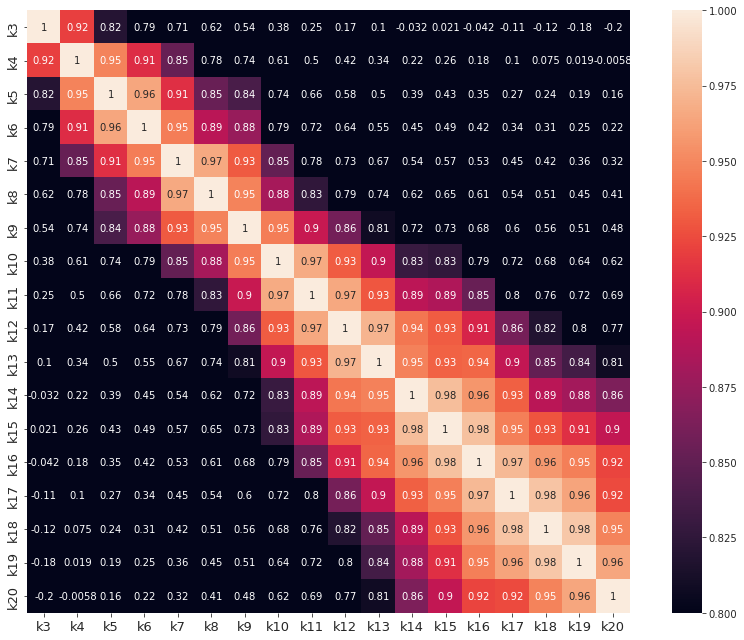

In [32]:
fig, ax = create_figure(1, 1, (12, 9))

sns.heatmap(
    sim_h,
    vmin=0.8,
    vmax=1.0,
    square=True,
    annot=True,
    fmt='.2g',
    ax=ax,
)
tick_labels = [f"k{k}" for k in kk_bo]
ax.set(
    xticklabels=tick_labels,
    yticklabels=tick_labels,
)
ax.tick_params(axis='both', labelsize=13)
plt.show()

### BOLD - mg

In [33]:
%%time

thres = 0.5

pi_avg = {}
pi_pr_avg = {}
pi_pr_all = {}
for kk in kk_bo:
    props_bo['num_k'] = kk + 1
    bt = BootStrap(**props_bo)
    if not hasattr(bt, 'run_pi') or kk == 3:
        continue
    pi_avg[f'{_BOLD}-mg\nk{kk}'.replace(' ', '')] = avg(bt._merge_vis(pi=bt.run_pi, thres=thres)[0])
    pi_pr_avg[f'{_BOLD}-mg\nk{kk}(pr95)'.replace(' ', '')] = avg(bt._merge_vis(pi=bt.pi_prune, thres=thres)[0])
    pi_pr_all[kk] = bt.pi_prune

# sort
d2p_bo = sort_pi_dict(pi_avg)
d2p_bo_pr = sort_pi_dict(pi_pr_avg)

CPU times: user 1min 15s, sys: 1min 32s, total: 2min 48s
Wall time: 3min 37s


In [34]:
bt.fit_meta

{}

#### Show pi ctx (raw)

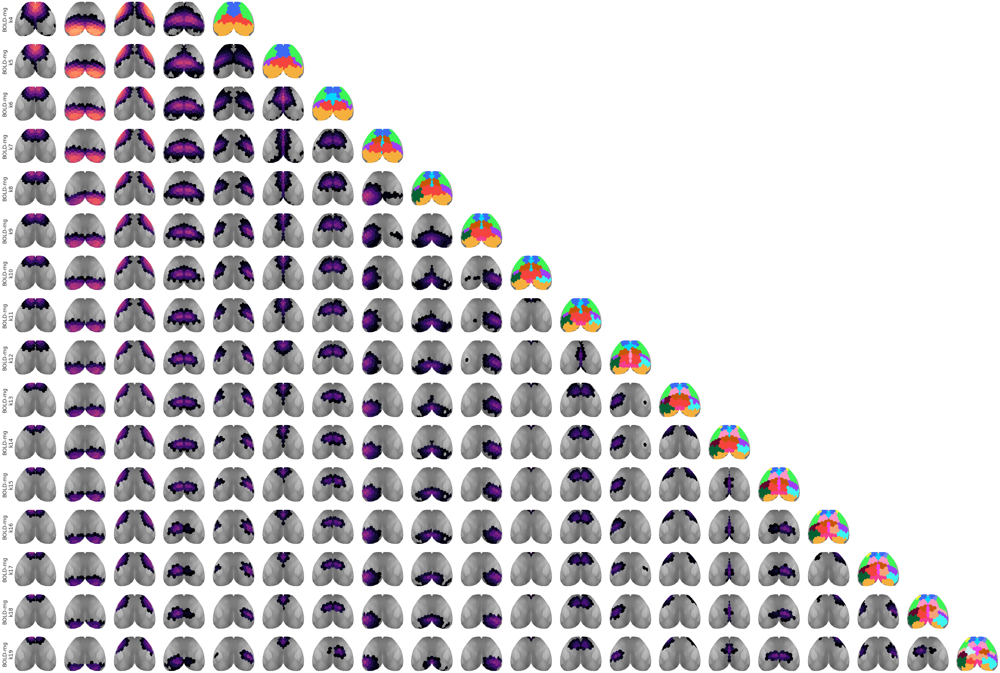

In [35]:
fig1, _ = bs.show(
    data=d2p_bo,
    figsize=(60, 42),
    ylabel_fontsize=18,
    contour=False,
)
fig1.savefig(pjoin(fig_dir, f'BOLD-mg_p20_k[{min(kk_bo)}-{max(kk_bo) - 1}].png'), **kws_fig)

#### Show pi ctx (prune)

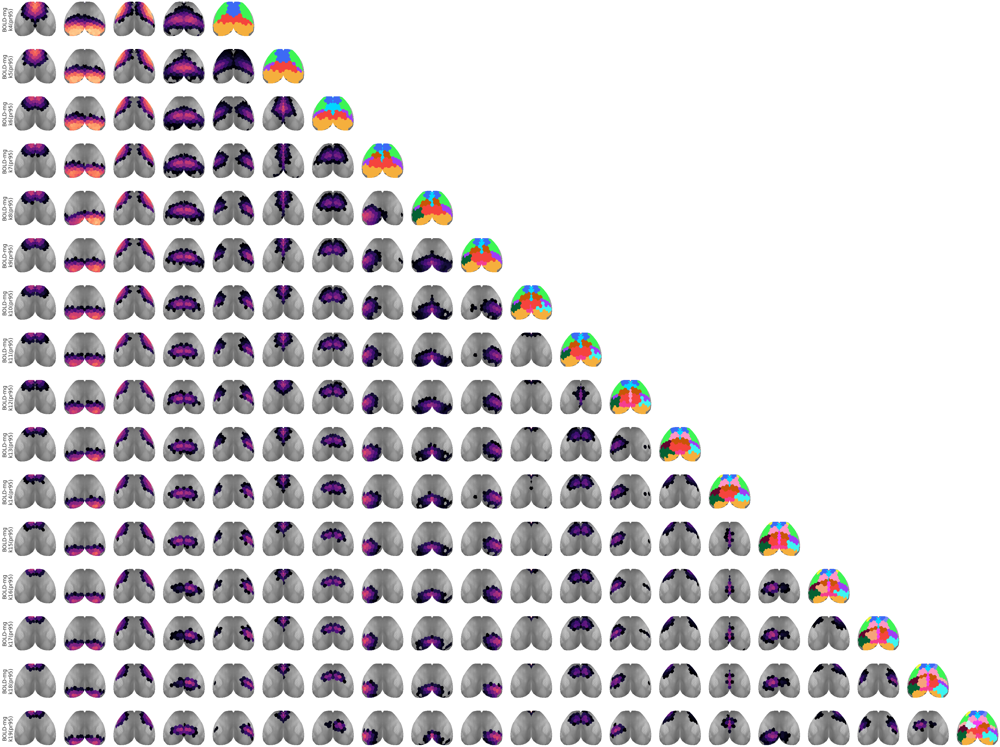

In [36]:
fig2, _ = bs.show(
    data=d2p_bo_pr,
    figsize=(64, 50),
    ylabel_fontsize=19,
    contour=False,
)
fig2.savefig(pjoin(fig_dir, f'BOLD-mg_p20_k[{min(kk_bo)}-{max(kk_bo) - 1}]_pr.png'), **kws_fig)

#### H

In [37]:
h_all = []
for kk, x in pi_pr_all.items():
    h = sp_stats.entropy(bn.nanmean(x, -3), axis=-2) / np.log(x.shape[-2])
    h_all.append(np.expand_dims(h, 0))
h_all = np.concatenate(h_all)
h_avg = avg(h_all, 1, 1)

np.nanmin(h_avg), np.nanmax(h_avg)

(0.168273020245917, 0.7379279180244842)

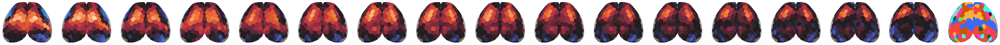

In [38]:
_ = bs.show(
    h_avg,
    vmin=np.nanmin(h_avg),
    vmax=np.nanmax(h_avg),
    figsize=(50, 7),
    cmap='icefire',
    contour=False,
)

In [39]:
sim_h = dist2sim(sp_dist.squareform(sp_dist.pdist(
    h_avg, metric='correlation')))

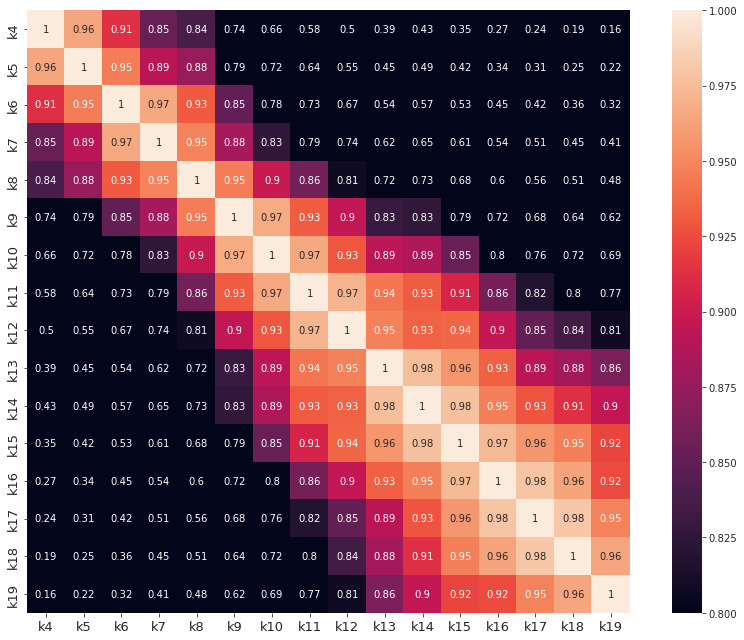

In [40]:
fig, ax = create_figure(1, 1, (12, 9))

sns.heatmap(
    sim_h,
    vmin=0.8,
    vmax=1.0,
    square=True,
    annot=True,
    fmt='.2g',
    ax=ax,
)
tick_labels = [f"k{k}" for i, k in enumerate(kk_bo) if i < len(pi_avg) + 1 and k > 3]
ax.set(
    xticklabels=tick_labels,
    yticklabels=tick_labels,
)
ax.tick_params(axis='both', labelsize=13)
plt.show()